In [ ]:
  !curl -s https://course.fast.ai/setup/colab | bash


Updating fastai...
Done.


In [ ]:
from fastai.vision import *
import numpy as np

In [ ]:
path = '/content/drive/My Drive/data science/datasets/photo_painting'

In [ ]:
np.random.seed(42)
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

In [ ]:
data

NameError: ignored

In [ ]:
data.classes


['painting', 'photo']

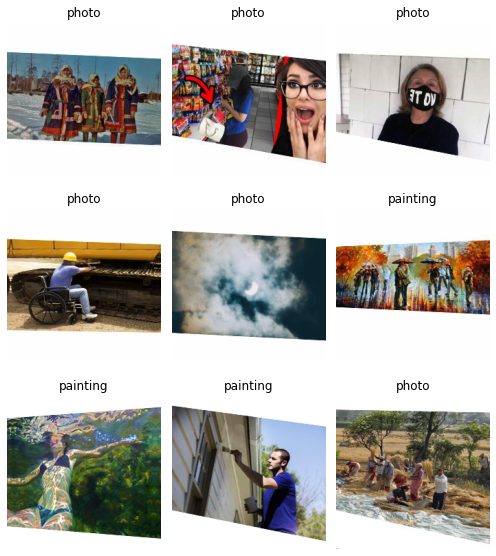

In [ ]:
data.show_batch(rows=3, figsize=(7,8))

In [ ]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)


(['painting', 'photo'], 2, 632, 157)

In [ ]:
learn = cnn_learner(data, models.resnet34, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth


In [ ]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.955160,0.583538,0.184713,04:27
1,0.695455,0.656855,0.184713,00:44
2,0.580164,0.553934,0.165605,00:09
3,0.496974,0.538295,0.191083,00:10


In [ ]:
learn.save('stage-1')

In [ ]:
learn.load('stage-1')

In [ ]:
learn.unfreeze()

In [ ]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


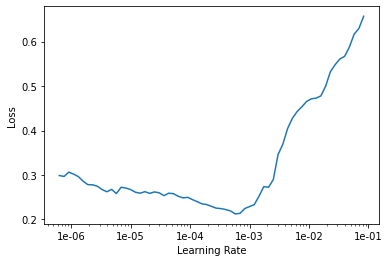

In [ ]:
learn.recorder.plot()

In [ ]:
learn.fit_one_cycle(2, max_lr=slice(3e-5,3e-4))

epoch,train_loss,valid_loss,error_rate,time
0,0.268380,0.870971,0.229299,00:10
1,0.263314,0.753790,0.203822,00:10


In [ ]:
learn.load('stage-1');

In [ ]:
from fastai.widgets import *

In [ ]:
db = (ImageList.from_folder(path)
                   .split_none()
                   .label_from_folder()
                   .transform(get_transforms(), size=224)
                   .databunch()
     )

In [ ]:
learn_cln = cnn_learner(db, models.resnet34, metrics=error_rate)


In [ ]:
ds, idxs = DatasetFormatter().from_toplosses(learn_cln)


In [ ]:
ImageCleaner(ds, idxs, path)

Button(button_style='primary', description='Next Batch', layout=Layout(width='auto'), style=ButtonStyle())

In [ ]:
ds, idxs = DatasetFormatter().from_similars(learn_cln)


Getting activations...


Computing similarities...


In [ ]:
ImageCleaner(ds, idxs, path, duplicates=True)


Button(button_style='primary', description='Next Batch', layout=Layout(width='auto'), style=ButtonStyle())

In [ ]:
ds

LabelList (789 items)
x: ImageList
Image (3, 250, 300),Image (3, 250, 300),Image (3, 250, 300),Image (3, 250, 300),Image (3, 250, 300)
y: CategoryList
photo,photo,photo,photo,photo
Path: /content/drive/My Drive/data science/datasets/photo_painting

In [ ]:
db = (ImageList.from_csv(path, 'cleaned.csv', folder='.')
                   .split_none()
                   .label_from_df()
                   .transform(get_transforms(), size=224)
                   .databunch()
     )

In [ ]:
learn_cln = cnn_learner(db, models.resnet34, metrics=error_rate)


In [ ]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.271755,0.585066,0.178344,00:10
1,0.279178,0.792910,0.171975,00:10
2,0.261173,0.614437,0.127389,00:11
3,0.208164,0.572488,0.127389,00:10


In [ ]:
learn.save('stage-87')

In [ ]:
learn.unfreeze()

In [ ]:

learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


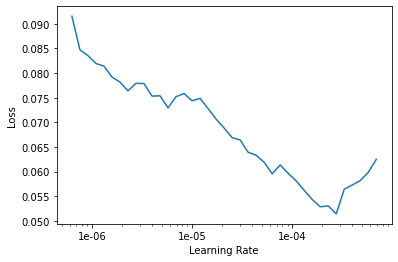

In [ ]:
learn.recorder.plot()

In [ ]:
learn.fit_one_cycle(2, max_lr=slice(3e-5,3e-4))

epoch,train_loss,valid_loss,error_rate,time
0,0.117480,0.452106,0.133758,00:10
1,0.073308,0.335468,0.108280,00:10


In [ ]:
learn.save('stage-87-unfreezed-lr:5_4') #good result

In [ ]:
learn.load('stage-87')

In [ ]:
learn.fit_one_cycle(2, max_lr=slice(3e-5,3e-3))

epoch,train_loss,valid_loss,error_rate,time
0,0.162878,0.692191,0.159236,00:10
1,0.161909,0.486761,0.127389,00:10


In [ ]:
#not so good

In [ ]:
learn.load('stage-87-unfreezed-lr:5_4')

NameError: ignored

In [ ]:
learn.export()

In [ ]:
data.classes

['painting', 'photo']

In [ ]:
img = open_image('/content/drive/My Drive/data science/datasets/img_test/paint2.jpg')
img

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img)
print(pred_class,outputs)

photo tensor([2.8355e-04, 9.9972e-01])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


In [ ]:
img = open_image('/content/drive/My Drive/data science/datasets/img_test/photo1.jpg')
img

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img)
print(pred_class,outputs)

photo tensor([2.8355e-04, 9.9972e-01])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


In [ ]:
defaults.device = torch.recompute_scale_factor=True

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img)
print(pred_class,outputs)

In [ ]:
img1 = open_image('/content/drive/My Drive/data science/datasets/img_test/pp1.jpg')
img2 = open_image('/content/drive/My Drive/data science/datasets/img_test/pp2.jpg')
img3 = open_image('/content/drive/My Drive/data science/datasets/img_test/pp3.jpg')
img4 = open_image('/content/drive/My Drive/data science/datasets/img_test/photo2.jpg')

In [ ]:
img1

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img1)
print(pred_class,outputs)

In [ ]:
img2

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img2)
print(pred_class,outputs)

painting tensor([0.9925, 0.0075])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


In [ ]:
img3

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img3)
print(pred_class,outputs)

painting tensor([9.9987e-01, 1.2524e-04])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


In [ ]:
img4


In [ ]:
pred_class,pred_idx,outputs = learn.predict(img4)
print(pred_class,outputs)

photo tensor([2.0587e-05, 9.9998e-01])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


In [ ]:
img_1 = open_image('/content/drive/My Drive/data science/datasets/img_test/EUOYm-LUcAEjYcw.jfif')
img_1_jpg = open_image('/content/drive/My Drive/data science/datasets/img_test/EUOYm-LUcAEjYcw.jpg')
img_2 = open_image('/content/drive/My Drive/data science/datasets/img_test/02_Bar_thelab92.jpg')
img_3 = open_image('/content/drive/My Drive/data science/datasets/img_test/IMG_20200204_105102.jpg')

img_4 = open_image('/content/drive/My Drive/data science/datasets/img_test/s1200 (2).jfif')
img_5 = open_image('/content/drive/My Drive/data science/datasets/img_test/s1200 (1).jfif')
img_6 = open_image('/content/drive/My Drive/data science/datasets/img_test/s1200.jfif')
img_7 = open_image('/content/drive/My Drive/data science/datasets/img_test/EUOYm-LUcAEjYcw.jpg')

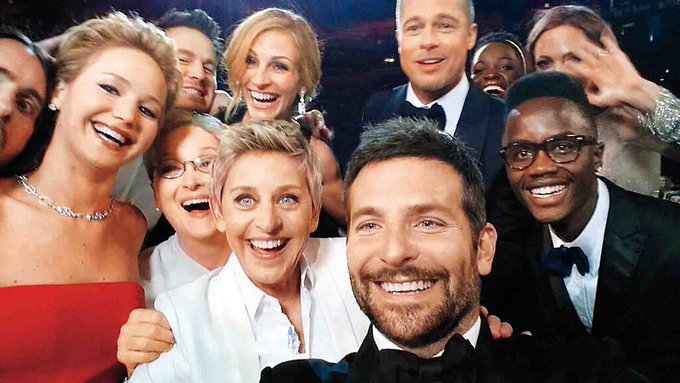

In [ ]:
img_1

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img_1)
print(pred_class,outputs)

painting tensor([0.5998, 0.4002])


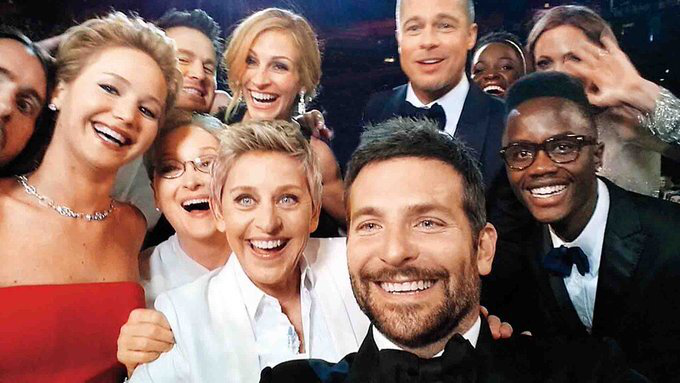

In [ ]:
img_1_jpg

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img_1_jpg)
print(pred_class,outputs)

painting tensor([0.5922, 0.4078])


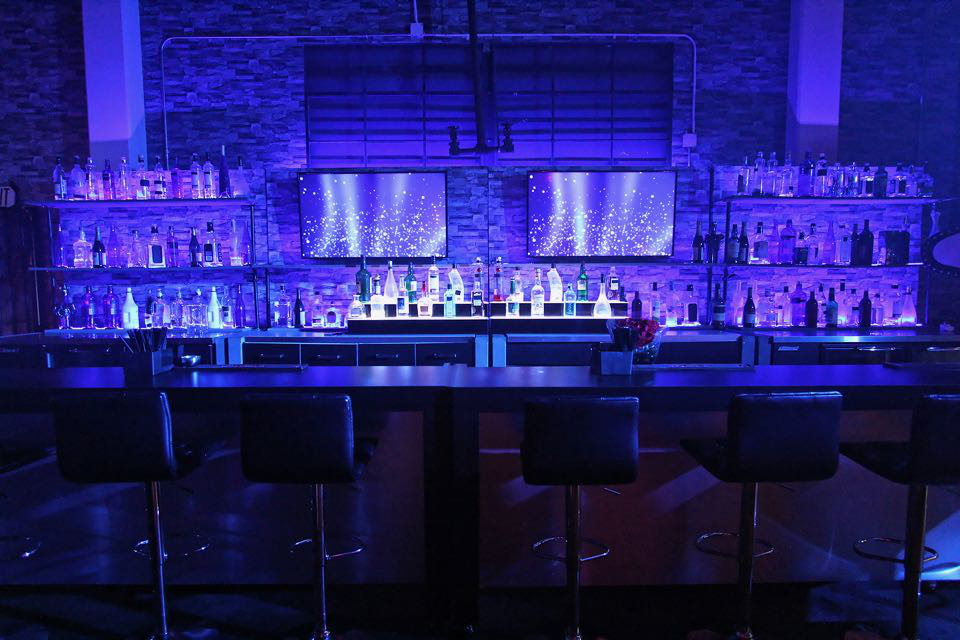

In [ ]:
img_2

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img_2)
print(pred_class,outputs)

photo tensor([0.0559, 0.9441])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


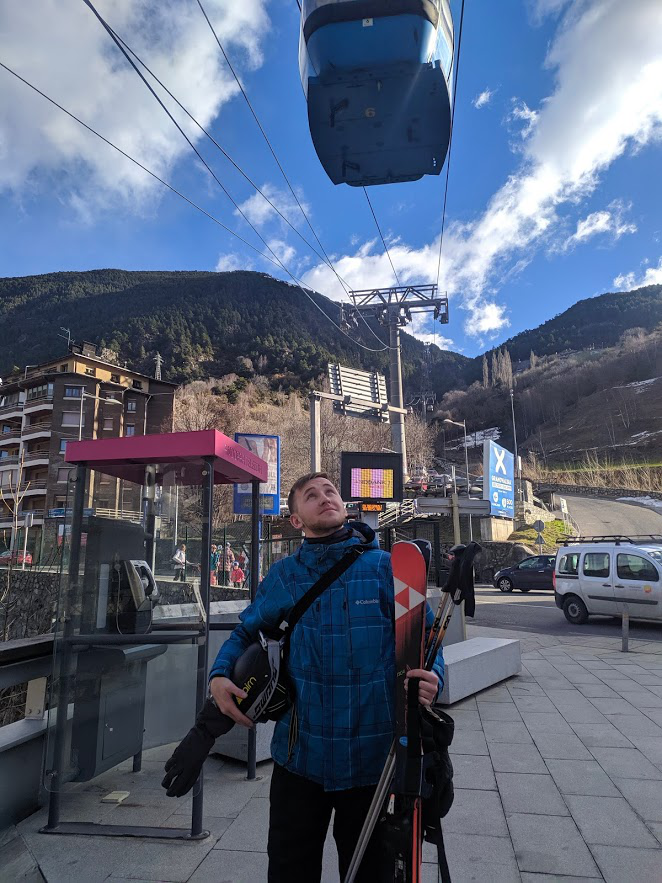

In [ ]:
img_3

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img_2)
print(pred_class,outputs)

photo tensor([0.0559, 0.9441])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


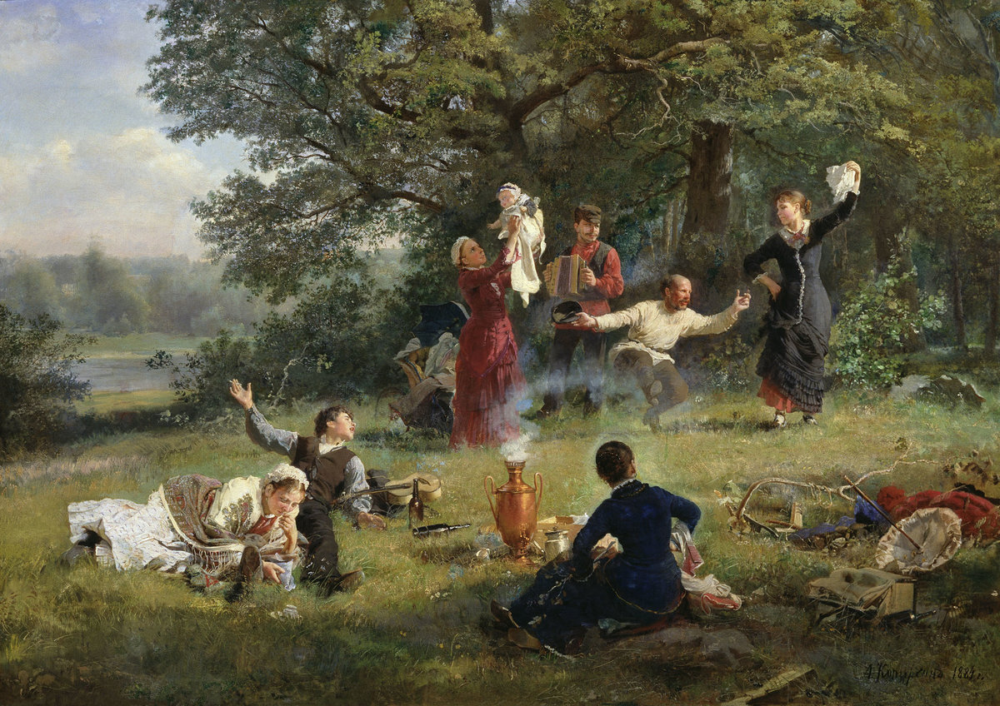

In [ ]:
img_4

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img_4)
print(pred_class,outputs)

photo tensor([0.0045, 0.9955])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


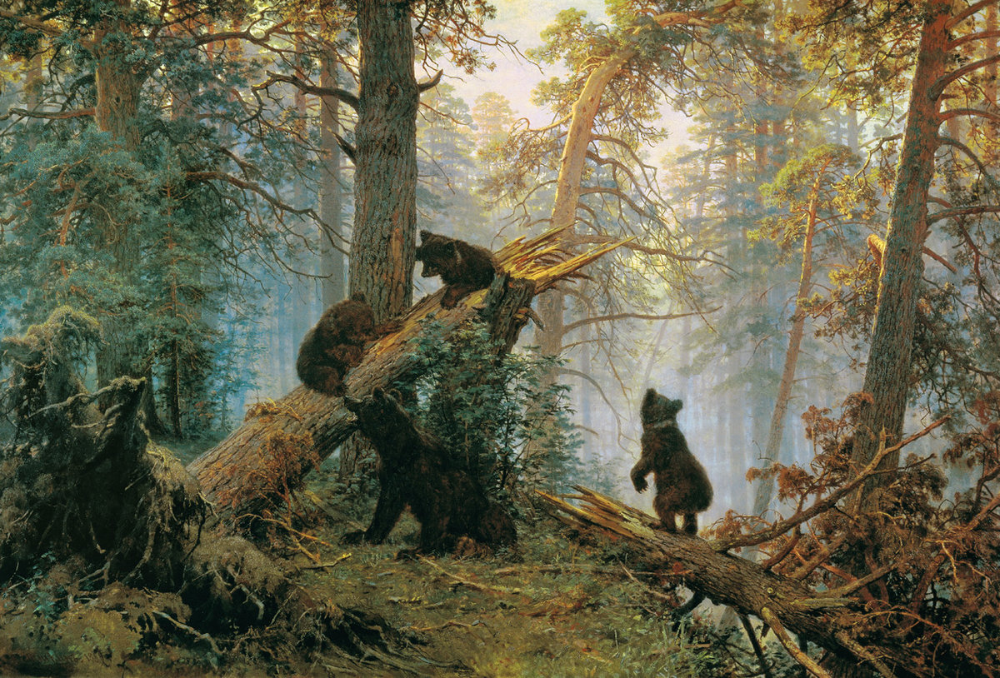

In [ ]:
img_5

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img_5)
print(pred_class,outputs)

photo tensor([3.8166e-04, 9.9962e-01])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


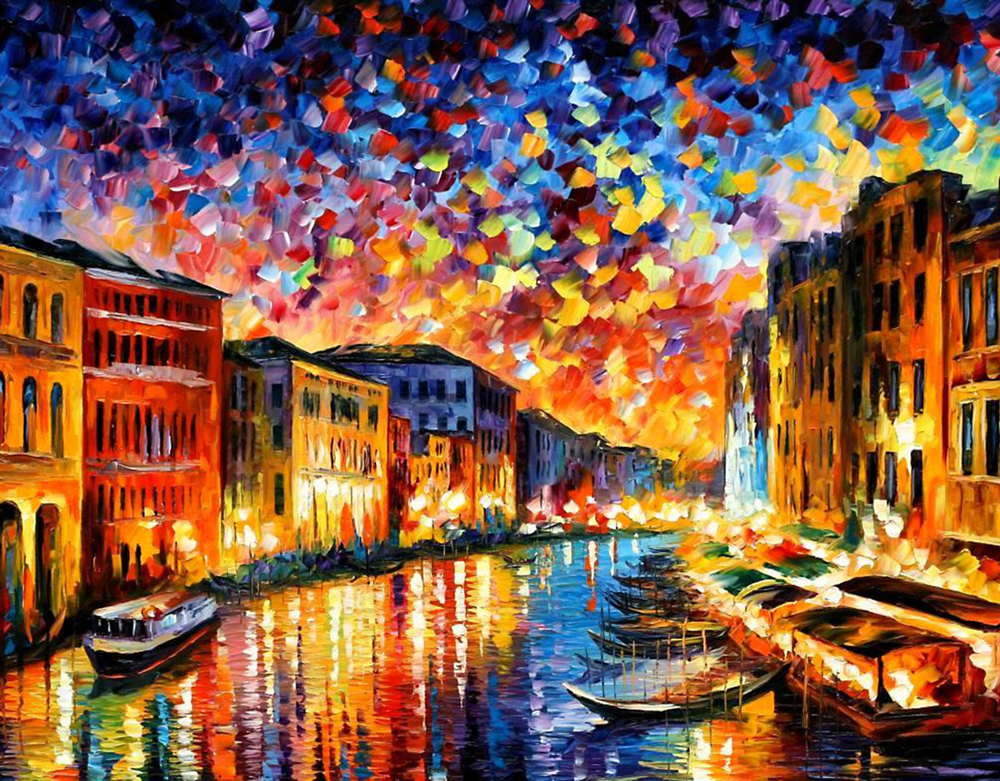

In [ ]:
img_6

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img_6)
print(pred_class,outputs)

photo tensor([0.0017, 0.9983])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


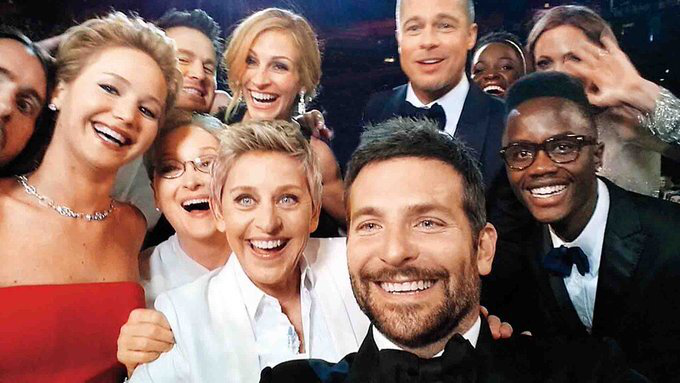

In [ ]:
img_7

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img_7)
print(pred_class,outputs)

painting tensor([0.5922, 0.4078])
